
<br>
<font>
<div dir=ltr align=center>
<font color=0F5298 size=7>
    Machine Learning <br> <br>
<font color=2565AE size=5>
    CE Department <br>
    Fall 2024 - Prof. Sharifi Zarchi<br>
<font color=3C99D size=5>
    HW4 Practical <br>
    Image Colorization<br>
    Image Segmentation<br>
<font color=696880 size=4>
    Shayan Shabani


This assignment is structured to introduce students to practical applications of generative models in computer vision.
It targets two challenging areas: colorization and segmentation, using architectures that are complex but very applicable in industry settings.
## Machine Learning Assignment #4: Practical Applications in Image Processing

## Learning Objectives:
By the end of this assignment, students will be able to:
1. Understand and implement Variational Autoencoders for image colorization.
2. Apply the U-Net architecture for image segmentation.
3. Preprocess image datasets, including augmentation techniques.
4. Analyze the performance of machine learning models using relevant metrics.
5. Explore the relationship between latent space and output quality in generative models.


# Image Colorization using VAE
In this section of the assignment, students will explore the fascinating field of image colorization using Variational Autoencoders (VAEs), a type of generative model in deep learning. The task involves transforming grayscale images into colored ones, leveraging the encoder-decoder architecture of VAEs, which are adept at learning complex data distributions. Students will implement and fine-tune an autoencoder network, utilizing components like perceptual loss and feature extraction from pre-trained models, to improve colorization output. By doing so, they will gain a deeper understanding of generative models and their practical applications in computer vision tasks. This exercise offers a hands-on opportunity to blend theoretical knowledge with practical coding skills, characterizing the creative potential of AI in image processing.

Dataset: https://drive.google.com/drive/folders/1KeJbfUykGnPlz0q08_b1IjtW8OxkPdQ9?usp=sharing

## Importing Libraries

In [ ]:
!pip install pytorch_lightning
!pip install seaborn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 48.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 51.3 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sea
from tqdm.notebook import tqdm
import os
import torch
import torch.nn as nn
import torch.optim as optim
import pytorch_lightning as pl
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn.functional as F
import torchmetrics
from torchmetrics import Metric
import torchvision
import math
import cv2
from PIL import Image
from torchvision import models
print(plt.style.available)
plt.style.use('seaborn-v0_8')
device = 'cuda' if torch.cuda.is_available() else 'cpu'

np.__version__, device

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


('1.26.4', 'cuda')

## Loading the Data

In [ ]:
def load_data(PATH):
    # TODO: Initialize lists to store filenames and their corresponding outcomes
    filenames = []
    outcomes = []
    class_map = {}
    class_counter = 0

    # TODO: Create a DataFrame from the filenames and outcomes
    for class_folder in os.listdir(PATH):
        class_folder_path = os.path.join(PATH, class_folder)

        if os.path.isdir(class_folder_path):
            if class_folder not in class_map:
                class_map[class_folder] = class_counter
                class_counter += 1

            for file in tqdm(os.listdir(class_folder_path)):
                if file.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp')):
                    full_path = os.path.join(class_folder_path, file)
                    filenames.append(full_path)
                    outcomes.append(class_map[class_folder])


    # TODO: Return the shuffled DataFrame
    df = pd.DataFrame({
        'filename': filenames,
        'outcome': outcomes
    })

    df = df.sample(frac=1).reset_index(drop=True)
    return df, class_map


# TODO: Load the training, validation, and test data using the load_data function
# train_df, train_class_map = load_data('/kaggle/input/dataset/archive/train')
# val_df, val_class_map = load_data('/kaggle/input/dataset/archive/valid')
# test_df, test_class_map = load_data('/kaggle/input/dataset/archive/test')

train_df, train_class_map = load_data('./dataset/archive/train')
val_df, val_class_map = load_data('./dataset/archive/valid')
test_df, test_class_map = load_data('./dataset/archive/test')

# TODO: Check the shape of the loaded DataFrames to verify correct data loading
print("Training DataFrame shape:", train_df.shape)
print("Validation DataFrame shape:", val_df.shape)
print("Test DataFrame shape:", test_df.shape)

  0%|          | 0/179 [00:00<?, ?it/s]

  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/155 [00:00<?, ?it/s]

  0%|          | 0/180 [00:00<?, ?it/s]

  0%|          | 0/164 [00:00<?, ?it/s]

  0%|          | 0/137 [00:00<?, ?it/s]

  0%|          | 0/158 [00:00<?, ?it/s]

  0%|          | 0/166 [00:00<?, ?it/s]

  0%|          | 0/137 [00:00<?, ?it/s]

  0%|          | 0/165 [00:00<?, ?it/s]

  0%|          | 0/179 [00:00<?, ?it/s]

  0%|          | 0/170 [00:00<?, ?it/s]

  0%|          | 0/154 [00:00<?, ?it/s]

  0%|          | 0/179 [00:00<?, ?it/s]

  0%|          | 0/166 [00:00<?, ?it/s]

  0%|          | 0/155 [00:00<?, ?it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/161 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Training DataFrame shape: (3208, 2)
Validation DataFrame shape: (100, 2)
Test DataFrame shape: (100, 2)


In [ ]:
# TODO: Combine the training and test data into a single DataFrame along the vertical axis
combined_df = pd.concat([train_df, test_df], axis=0).reset_index(drop=True)

print("\nCombined DataFrame shape:", combined_df.shape)


Combined DataFrame shape: (3308, 2)


In [ ]:
# TODO: Explore the new DataFrame
combined_df.sample(5)

,filename,outcome
331,./dataset/archive/train/ALTAMIRA YELLOWTHROAT/...,17
2716,./dataset/archive/train/AFRICAN EMERALD CUCKOO...,12
2309,./dataset/archive/train/AMERICAN COOT/123.jpg,6
1461,./dataset/archive/train/AMERICAN GOLDFINCH/060...,18
3194,./dataset/archive/train/AFRICAN EMERALD CUCKOO...,12


## Plot some of the images

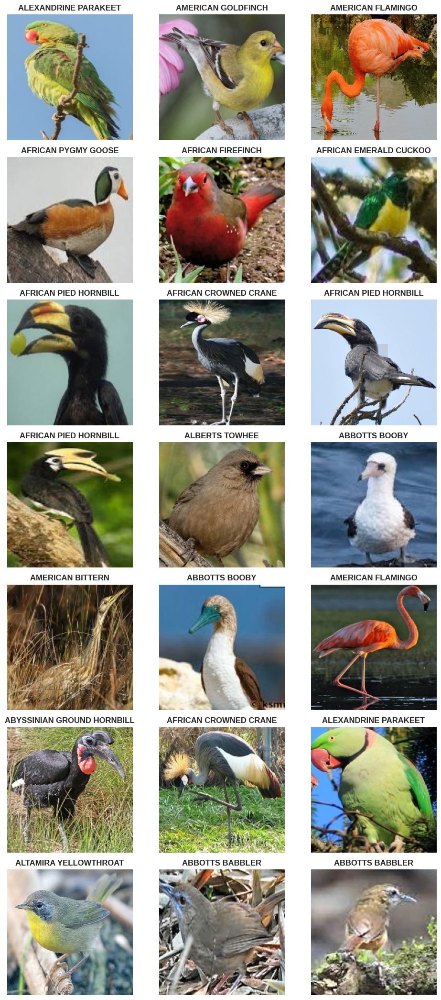

In [ ]:
def plot_images(dataframe, class_map, num_images=21):
    """
    Plots a grid of images along with their class names using the class map.

    Parameters:
    - dataframe: DataFrame with 'filename' and 'outcome' columns.
    - class_map: Dictionary mapping class names to numeric outcomes.
    - num_images: Total number of images to display in the grid.
    """
    inverted_class_map = {v: k for k, v in class_map.items()}
    sample_df = dataframe.sample(n=num_images).reset_index(drop=True)
    cols = 3
    rows = (num_images + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(10, rows * 3))

    for i, ax in enumerate(axes.flatten()):
        if i < len(sample_df):
            img_path = sample_df.loc[i, 'filename']
            outcome = sample_df.loc[i, 'outcome']
            class_name = inverted_class_map[outcome]

            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            ax.imshow(img)
            ax.axis('off')
            ax.set_title(class_name, fontsize=12, fontweight='bold')
        else:
            ax.axis('off')

    plt.tight_layout()
    plt.show()

plot_images(combined_df, train_class_map, num_images=21)

## Dataset Distribution
plot the distribution of the dataset, both training and validation set

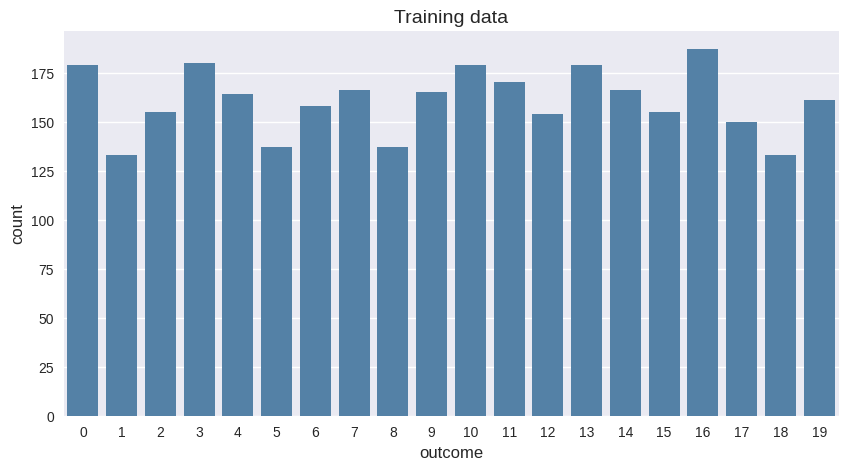

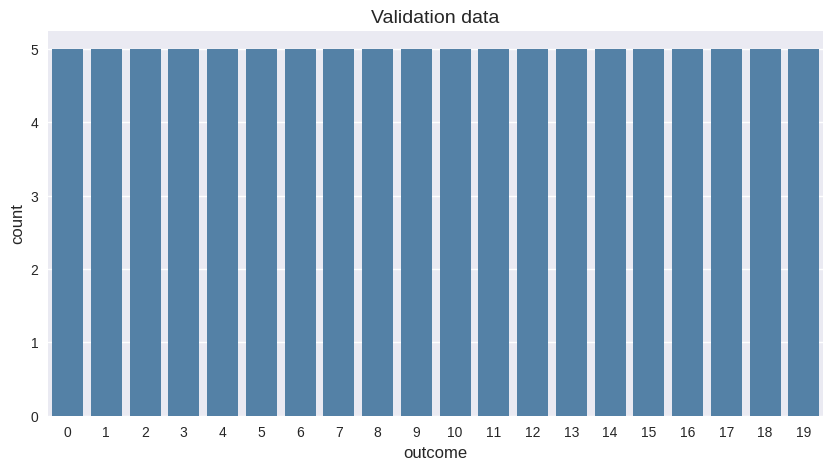

In [ ]:
# TODO: Plot the distribution of classes
import seaborn as sns
import matplotlib.pyplot as plt

def plot_class_distribution(dataframe, title):
    """
    Plots the distribution of classes in a given DataFrame.

    Parameters:
    - dataframe: DataFrame with 'outcome' column representing the class labels.
    - title: Title of the plot.
    """
    plt.figure(figsize=(10, 5))
    sns.countplot(data=dataframe, x='outcome', color='steelblue')
    plt.title(title, fontsize=14)
    plt.xlabel('outcome', fontsize=12)
    plt.ylabel('count', fontsize=12)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.show()

plot_class_distribution(train_df, "Training data")
plot_class_distribution(val_df, "Validation data")

## Dataset Preparation
Now we are going to build the dataset by using `Dataset` and `DataLoader` classes within PyTorch. I recommend you to randomly crop the images to (160, 160) and then normalize them.

In [ ]:
class BirdDataset:
    def __init__(self, df, transform=None, grayscale_transform=None):
        # TODO: Initialize the needed data
        self.df = df
        self.transform = transform
        self.grayscale_transform = grayscale_transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        # TODO: Load and transform an image
        img_path = self.df.iloc[idx]['filename']
        label = self.df.iloc[idx]['outcome']

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        grayscale_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

        if self.grayscale_transform:
            grayscale_image = self.grayscale_transform(grayscale_image)
        if self.transform:
            rgb_image = self.transform(image)

        if len(grayscale_image.shape) == 2:
             grayscale_image = grayscale_image.unsqueeze(0)
        elif grayscale_image.shape[0] == 1 and len(grayscale_image.shape) == 3:
            grayscale_image = grayscale_image.squeeze(1)

        return grayscale_image, rgb_image, torch.tensor(label, dtype=torch.long)


train_rgb_transforms = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((160, 160)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

train_grayscale_transforms = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((160, 160)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5])
])

val_rgb_transforms = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((160, 160)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

val_grayscale_transforms = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((160, 160)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5])
])

train_dataset = BirdDataset(
    df=train_df,
    transform=train_rgb_transforms,
    grayscale_transform=train_grayscale_transforms
)
val_dataset = BirdDataset(
    df=val_df,
    transform=val_rgb_transforms,
    grayscale_transform=val_grayscale_transforms
)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=4)

for grayscale_images, rgb_images, labels in train_loader:
    print(f"Grayscale Batch: {grayscale_images.shape}, RGB Batch: {rgb_images.shape}, Labels: {labels.shape}")
    break

print(len(train_dataset), '-', len(val_dataset))

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Grayscale Batch: torch.Size([32, 1, 160, 160]), RGB Batch: torch.Size([32, 3, 160, 160]), Labels: torch.Size([32])
3208 - 100


**Why is data augmentation pivotal in training models for image tasks, and what techniques are beneficial for this particular assignment?**

### Why is Data Augmentation Pivotal in Training Models for Image Tasks?

Data augmentation plays a crucial role in training models for image tasks by artificially expanding the training dataset and improving the model's ability to generalize. By applying random transformations to images, data augmentation introduces variations in the dataset that help the model become robust to real-world scenarios where inputs may differ in orientation, scale, brightness, or other attributes. This is especially important when the size of the dataset is limited.

**Key Benefits of Data Augmentation**:
1. **Improves Generalization**: By exposing the model to diverse variations of the same data, it reduces the risk of overfitting and enhances the model's performance on unseen data.
2. **Handles Real-World Variability**: Augmentation mimics the variability present in real-world scenarios, making the model robust to changes like lighting conditions, rotations, and noise.
3. **Maximizes Data Utility**: Small datasets can still be used effectively by augmenting images to generate additional training samples.

### Techniques Beneficial for This Assignment

In this particular assignment, we are working with bird images. Useful augmentation techniques include:

1. **Random Cropping and Resizing**:
   - Randomly crops parts of an image and resizes them to a fixed size.
   - Simulates variability in how a subject might be framed in an image.

2. **Color Jittering**:
   - Randomly adjusts brightness, contrast, saturation, and hue of the image.
   - Mimics variations in lighting conditions or camera settings.

3. **Random Horizontal Flipping**:
   - Flips the image horizontally with a certain probability.
   - Helps the model learn symmetry and handle variations in object orientation.

4. **Normalization**:
   - Scales pixel values to have a mean of 0 and a standard deviation of 1.
   - Ensures consistent input range for the model and speeds up convergence during training.

5. **Random Rotation**:
   - Rotates the image by a small, random angle.
   - Improves robustness to slight misalignments during image capture.

By applying these augmentation techniques, we can create a robust model capable of identifying bird species even in challenging or varied visual contexts.


## Model Architecture
The model has an encoder block for encoding the grayscale image into a lower representation followed by a decoder block to generate the colorized image.

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchvision import models
from tqdm import tqdm

class SEBlock(nn.Module):
    def __init__(self, channels, reduction=16):
        super(SEBlock, self).__init__()
        self.squeeze = nn.AdaptiveAvgPool2d(1)
        self.excitation = nn.Sequential(
            nn.Linear(channels, channels // reduction, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(channels // reduction, channels, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.squeeze(x).view(b, c)
        y = self.excitation(y).view(b, c, 1, 1)
        return x * y.expand_as(x)

class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels, use_se=False):
        super(ResidualBlock, self).__init__()
        self.use_se = use_se
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1)
        self.gn1 = nn.GroupNorm(num_groups=8, num_channels=out_channels)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1)
        self.gn2 = nn.GroupNorm(num_groups=8, num_channels=out_channels)
        if self.use_se:
            self.se = SEBlock(out_channels)
        if in_channels != out_channels:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=1, padding=0),
                nn.GroupNorm(num_groups=8, num_channels=out_channels)
            )
        else:
            self.shortcut = nn.Identity()

    def forward(self, x):
        identity = self.shortcut(x)
        out = self.conv1(x)
        out = self.gn1(out)
        out = self.relu(out)
        out = self.conv2(out)
        out = self.gn2(out)
        if self.use_se:
            out = self.se(out)
        out += identity
        out = self.relu(out)
        return out

class SelfAttention(nn.Module):
    def __init__(self, in_dim):
        super(SelfAttention, self).__init__()
        self.query_conv = nn.Conv2d(in_dim, in_dim // 8, kernel_size=1)
        self.key_conv = nn.Conv2d(in_dim, in_dim // 8, kernel_size=1)
        self.value_conv = nn.Conv2d(in_dim, in_dim, kernel_size=1)
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim=-1)

    def forward(self, x):
        m_batchsize, C, width, height = x.size()
        proj_query = self.query_conv(x).view(m_batchsize, -1, width * height).permute(0, 2, 1)
        proj_key = self.key_conv(x).view(m_batchsize, -1, width * height)
        energy = torch.bmm(proj_query, proj_key)
        attention = self.softmax(energy)
        proj_value = self.value_conv(x).view(m_batchsize, -1, width * height)
        out = torch.bmm(proj_value, attention.permute(0, 2, 1))
        out = out.view(m_batchsize, C, width, height)
        out = self.gamma * out + x
        return out

class PerceptualLoss(nn.Module):
    def __init__(self, feature_layers=None, use_half=False):
        super(PerceptualLoss, self).__init__()
        vgg = models.vgg19(pretrained=True).features
        self.layers = nn.ModuleList()
        if feature_layers is None:
            feature_layers = [0, 5, 10, 19, 28]
        self.feature_layers = feature_layers
        for i in range(max(feature_layers) + 1):
            self.layers.append(vgg[i])
        for param in self.layers.parameters():
            param.requires_grad = False
        self.use_half = use_half

    def forward(self, x, y):
        if self.use_half:
            x = x.half()
            y = y.half()
        mean = torch.tensor([0.485, 0.456, 0.406]).view(1,3,1,1).to(x.device)
        std = torch.tensor([0.229, 0.224, 0.225]).view(1,3,1,1).to(x.device)
        x = (x - mean) / std
        y = (y - mean) / std
        loss = 0
        for i, layer in enumerate(self.layers):
            x = layer(x)
            y = layer(y)
            if i in self.feature_layers:
                loss += F.l1_loss(x, y)
        return loss

class Encoder(nn.Module):
    def __init__(self, do_bn=False, latent_dim=128):
        super(Encoder, self).__init__()
        self.do_bn = do_bn
        self.block1 = self.inner_block(1, 32)
        self.block2 = self.inner_block(32, 64)
        self.block3 = self.inner_block(64, 128)
        self.block4 = self.inner_block(128, 256)
        self.self_attention = SelfAttention(256)
        self.fc_mu = nn.Linear(256*10*10, latent_dim)
        self.fc_logvar = nn.Linear(256*10*10, latent_dim)

    def inner_block(self, in_c, out_c, maxpool=2):
        layers = [
            ResidualBlock(in_c, out_c, use_se=True),
            nn.MaxPool2d(kernel_size=maxpool, stride=maxpool),
            nn.Dropout(0.1)
        ]
        return nn.Sequential(*layers)

    def forward(self, x):
        features = []
        x = self.block1(x)  # (B,32,80,80)
        features.append(x)
        x = self.block2(x)  # (B,64,40,40)
        features.append(x)
        x = self.block3(x)  # (B,128,20,20)
        features.append(x)
        x = self.block4(x)  # (B,256,10,10)
        x = self.self_attention(x)  # (B,256,10,10)
        features.append(x)
        x = x.view(x.size(0), -1)
        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        return mu, logvar, features

class Decoder(nn.Module):
    def __init__(self, do_bn=False, latent_dim=128):
        super(Decoder, self).__init__()
        self.do_bn = do_bn
        self.fc = nn.Linear(latent_dim, 256*10*10)
        self.self_attention = SelfAttention(256)
        self.up1 = self.inner_block(256, 128)
        self.up2 = self.inner_block(128 + 128, 64)
        self.up3 = self.inner_block(64 + 64, 32)
        self.up4 = self.inner_block(32 + 32, 16)
        self.final_conv = nn.Conv2d(16, 3, kernel_size=3, stride=1, padding=1)
        self.sigmoid = nn.Sigmoid()

    def inner_block(self, in_c, out_c):
        layers = [
            nn.ConvTranspose2d(in_c, out_c, kernel_size=2, stride=2),
            nn.GroupNorm(num_groups=8, num_channels=out_c),
            nn.ReLU(inplace=True)
        ]
        return nn.Sequential(*layers)

    def forward(self, z, skip_features):
        h = self.fc(z)  # (B,256*10*10)
        h = h.view(h.size(0), 256, 10, 10)  # (B,256,10,10)
        h = self.self_attention(h)  # (B,256,10,10)
        h = self.up1(h)  # (B,128,20,20)
        h = torch.cat([h, skip_features[2]], dim=1)  # (B,256,20,20)
        h = self.up2(h)  # (B,64,40,40)
        h = torch.cat([h, skip_features[1]], dim=1)  # (B,128,40,40)
        h = self.up3(h)  # (B,32,80,80)
        h = torch.cat([h, skip_features[0]], dim=1)  # (B,64,80,80)
        h = self.up4(h)  # (B,16,160,160)
        h = self.final_conv(h)  # (B,3,160,160)
        h = self.sigmoid(h)
        return h

class Net(nn.Module):
    def __init__(self, latent_dim=128, lr=1e-4, do_bn=False, use_perceptual_loss=True):
        super(Net, self).__init__()
        self.encoder = Encoder(do_bn=do_bn, latent_dim=latent_dim)
        self.decoder = Decoder(do_bn=do_bn, latent_dim=latent_dim)
        self.use_perceptual_loss = use_perceptual_loss
        if use_perceptual_loss:
            self.perceptual_loss = PerceptualLoss(feature_layers=[0, 5, 10, 19, 28])
        self.optim = optim.AdamW(self.parameters(), lr=lr)
        self.scheduler = optim.lr_scheduler.StepLR(self.optim, step_size=20, gamma=0.5)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5*logvar)
        eps = torch.randn_like(std)
        return mu + eps*std

    def forward(self, x):
        mu, logvar, skip_features = self.encoder(x)
        z = self.reparameterize(mu, logvar)
        recon = self.decoder(z, skip_features)
        return recon, mu, logvar

    def compute_loss(self, pred, target, mu, logvar):
        recon_loss = F.mse_loss(pred, target)
        if self.use_perceptual_loss:
            perceptual = self.perceptual_loss(pred, target)
            recon_loss += 0.01 * perceptual
        kld_loss = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
        loss = recon_loss + 0.001 * kld_loss
        return loss, recon_loss, kld_loss

    def training_step(self, batch):
        grayscale_images, rgb_images, _ = batch
        device = next(self.parameters()).device
        grayscale_images = grayscale_images.to(device)
        rgb_images = rgb_images.to(device)
        self.train()
        self.optim.zero_grad()
        recon, mu, logvar = self.forward(grayscale_images)
        loss, recon_loss, kld_loss = self.compute_loss(recon, rgb_images, mu, logvar)
        loss.backward()
        self.optim.step()
        return loss.item(), recon_loss.item(), kld_loss.item()

    def validation_step(self, batch):
        with torch.no_grad():
            grayscale_images, rgb_images, _ = batch
            device = next(self.parameters()).device
            grayscale_images = grayscale_images.to(device)
            rgb_images = rgb_images.to(device)
            self.eval()
            recon, mu, logvar = self.forward(grayscale_images)
            loss, recon_loss, kld_loss = self.compute_loss(recon, rgb_images, mu, logvar)
        return loss.item(), recon_loss.item(), kld_loss.item()

    def train_model(self, train_loader, val_loader, epochs=50, device='cuda'):
        self.to(device)
        train_loss_history = []
        val_loss_history = []
        for epoch in range(epochs):
            train_losses = []
            for batch in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs} [Train]"):
                train_losses.append(self.training_step(batch))
            val_losses = []
            for batch in tqdm(val_loader, desc=f"Epoch {epoch+1}/{epochs} [Val]"):
                val_losses.append(self.validation_step(batch))
            train_loss_avg = torch.tensor([x[0] for x in train_losses]).mean().item()
            val_loss_avg = torch.tensor([x[0] for x in val_losses]).mean().item()
            train_loss_history.append(train_loss_avg)
            val_loss_history.append(val_loss_avg)
            self.scheduler.step(val_loss_avg)
            print(f"Epoch {epoch+1}/{epochs}: Train Loss: {train_loss_avg:.4f}, Val Loss: {val_loss_avg:.4f}")
        return train_loss_history, val_loss_history

In [ ]:
# TODO: print the model
model = Net()

print(model)

Net(
  (encoder): Encoder(
    (block1): Sequential(
      (0): ResidualBlock(
        (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (gn1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (gn2): GroupNorm(8, 32, eps=1e-05, affine=True)
        (se): SEBlock(
          (squeeze): AdaptiveAvgPool2d(output_size=1)
          (excitation): Sequential(
            (0): Linear(in_features=32, out_features=2, bias=False)
            (1): ReLU(inplace=True)
            (2): Linear(in_features=2, out_features=32, bias=False)
            (3): Sigmoid()
          )
        )
        (shortcut): Sequential(
          (0): Conv2d(1, 32, kernel_size=(1, 1), stride=(1, 1))
          (1): GroupNorm(8, 32, eps=1e-05, affine=True)
        )
      )
      (1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (2): Dropout(

## Training Phase

In [18]:
# TODO: Train
# Students should implement the training loop. During training, monitor both training and validation metrics
# to ensure the model learns effectively without overfitting.
# Assuming train_loader and val_loader are defined
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Initialize the model
model = Net().to(device)

# Train the model
train_loss_history, val_loss_history = model.train_model(
    train_loader=train_loader,
    val_loader=val_loader,
    epochs=50,
    device=device
)

Epoch 1/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.17it/s]


Epoch 1/50: Train Loss: 0.8554, Val Loss: 0.7723


Epoch 2/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.14it/s]


Epoch 2/50: Train Loss: 0.6653, Val Loss: 0.6582


Epoch 3/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.52it/s]


Epoch 3/50: Train Loss: 0.5957, Val Loss: 0.6101


Epoch 4/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.77it/s]


Epoch 4/50: Train Loss: 0.5611, Val Loss: 0.5842


Epoch 5/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.65it/s]


Epoch 5/50: Train Loss: 0.5412, Val Loss: 0.5679


Epoch 6/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.25it/s]


Epoch 6/50: Train Loss: 0.5288, Val Loss: 0.5561


Epoch 7/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.24it/s]


Epoch 7/50: Train Loss: 0.5192, Val Loss: 0.5474


Epoch 8/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.53it/s]


Epoch 8/50: Train Loss: 0.5122, Val Loss: 0.5404


Epoch 9/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.87it/s]


Epoch 9/50: Train Loss: 0.5070, Val Loss: 0.5334


Epoch 10/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.72it/s]


Epoch 10/50: Train Loss: 0.4995, Val Loss: 0.5263


Epoch 11/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.67it/s]


Epoch 11/50: Train Loss: 0.4931, Val Loss: 0.5206


Epoch 12/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.56it/s]


Epoch 12/50: Train Loss: 0.4883, Val Loss: 0.5163


Epoch 13/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.35it/s]


Epoch 13/50: Train Loss: 0.4846, Val Loss: 0.5132


Epoch 14/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.31it/s]


Epoch 14/50: Train Loss: 0.4820, Val Loss: 0.5106


Epoch 15/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.24it/s]


Epoch 15/50: Train Loss: 0.4799, Val Loss: 0.5084


Epoch 16/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.75it/s]


Epoch 16/50: Train Loss: 0.4776, Val Loss: 0.5060


Epoch 17/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.86it/s]


Epoch 17/50: Train Loss: 0.4759, Val Loss: 0.5045


Epoch 18/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.17it/s]


Epoch 18/50: Train Loss: 0.4743, Val Loss: 0.5028


Epoch 19/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.17it/s]


Epoch 19/50: Train Loss: 0.4728, Val Loss: 0.5008


Epoch 20/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.24it/s]


Epoch 20/50: Train Loss: 0.4717, Val Loss: 0.4996


Epoch 21/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.89it/s]


Epoch 21/50: Train Loss: 0.4698, Val Loss: 0.4988


Epoch 22/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.74it/s]


Epoch 22/50: Train Loss: 0.4691, Val Loss: 0.4973


Epoch 23/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.84it/s]


Epoch 23/50: Train Loss: 0.4672, Val Loss: 0.4961


Epoch 24/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.66it/s]


Epoch 24/50: Train Loss: 0.4663, Val Loss: 0.4954


Epoch 25/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.78it/s]


Epoch 25/50: Train Loss: 0.4657, Val Loss: 0.4938


Epoch 26/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.65it/s]


Epoch 26/50: Train Loss: 0.4648, Val Loss: 0.4929


Epoch 27/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.43it/s]


Epoch 27/50: Train Loss: 0.4648, Val Loss: 0.4918


Epoch 28/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.53it/s]


Epoch 28/50: Train Loss: 0.4633, Val Loss: 0.4914


Epoch 29/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.63it/s]


Epoch 29/50: Train Loss: 0.4626, Val Loss: 0.4904


Epoch 30/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.08it/s]


Epoch 30/50: Train Loss: 0.4609, Val Loss: 0.4898


Epoch 31/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.26it/s]


Epoch 31/50: Train Loss: 0.4609, Val Loss: 0.4896


Epoch 32/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.24it/s]


Epoch 32/50: Train Loss: 0.4597, Val Loss: 0.4888


Epoch 33/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.89it/s]


Epoch 33/50: Train Loss: 0.4581, Val Loss: 0.4883


Epoch 34/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.86it/s]


Epoch 34/50: Train Loss: 0.4582, Val Loss: 0.4876


Epoch 35/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.59it/s]


Epoch 35/50: Train Loss: 0.4565, Val Loss: 0.4877


Epoch 36/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.74it/s]


Epoch 36/50: Train Loss: 0.4552, Val Loss: 0.4863


Epoch 37/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.65it/s]


Epoch 37/50: Train Loss: 0.4541, Val Loss: 0.4866


Epoch 38/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.19it/s]


Epoch 38/50: Train Loss: 0.4528, Val Loss: 0.4858


Epoch 39/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.24it/s]


Epoch 39/50: Train Loss: 0.4511, Val Loss: 0.4859


Epoch 40/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.02it/s]


Epoch 40/50: Train Loss: 0.4503, Val Loss: 0.4853


Epoch 41/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.01it/s]


Epoch 41/50: Train Loss: 0.4494, Val Loss: 0.4887


Epoch 42/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.90it/s]


Epoch 42/50: Train Loss: 0.4482, Val Loss: 0.4847


Epoch 43/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.78it/s]


Epoch 43/50: Train Loss: 0.4472, Val Loss: 0.4843


Epoch 44/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.84it/s]


Epoch 44/50: Train Loss: 0.4458, Val Loss: 0.4856


Epoch 45/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.82it/s]


Epoch 45/50: Train Loss: 0.4440, Val Loss: 0.4846


Epoch 46/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  2.49it/s]


Epoch 46/50: Train Loss: 0.4436, Val Loss: 0.4844


Epoch 47/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.19it/s]


Epoch 47/50: Train Loss: 0.4421, Val Loss: 0.4840


Epoch 48/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.25it/s]


Epoch 48/50: Train Loss: 0.4419, Val Loss: 0.4839


Epoch 49/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.30it/s]


Epoch 49/50: Train Loss: 0.4403, Val Loss: 0.4846


Epoch 50/50 [Val]: 100%|██████████| 4/4 [00:01<00:00,  3.01it/s]

Epoch 50/50: Train Loss: 0.4390, Val Loss: 0.4832


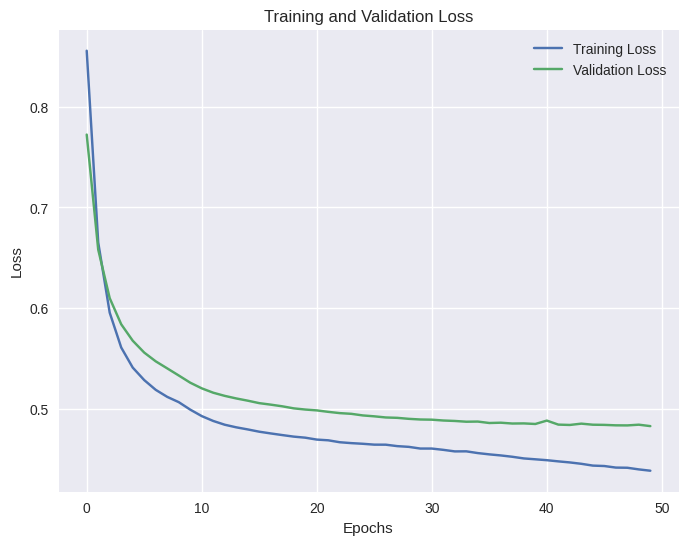

In [19]:
# TODO: Plot training and validation loss over epochs
plt.figure(figsize=(8, 6))
plt.plot(train_loss_history, label='Training Loss')
plt.plot(val_loss_history, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

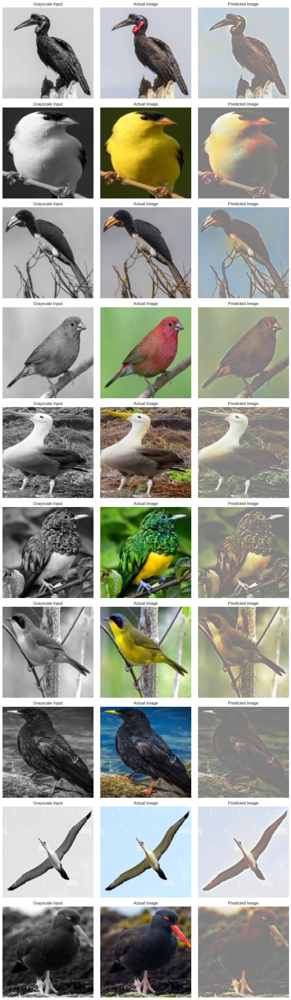

In [20]:
# TODO: Plot grayscale, actual, and predicted inputs
import matplotlib.pyplot as plt

def show_images(model, data_loader, device='cuda', num_samples=10):
    model.eval()
    model.to(device)

    batch = next(iter(data_loader))
    grayscale_images, rgb_images, _ = batch
    grayscale_images = grayscale_images.to(device)
    rgb_images = rgb_images.to(device)

    with torch.no_grad():
        recon, mu, logvar = model(grayscale_images)

    grayscale_images = grayscale_images.cpu()
    rgb_images = rgb_images.cpu()
    recon = recon.cpu()

    def unnormalize(tensor, is_grayscale=False):
        if is_grayscale:
            mean = torch.tensor([0.5]).view(1, 1, 1)
            std = torch.tensor([0.5]).view(1, 1, 1)
        else:
            mean = torch.tensor([0.5, 0.5, 0.5]).view(-1, 1, 1)
            std = torch.tensor([0.5, 0.5, 0.5]).view(-1, 1, 1)
        return tensor * std + mean

    fig, axes = plt.subplots(nrows=num_samples, ncols=3, figsize=(12, 4 * num_samples))

    for i in range(num_samples):
        grayscale_img = unnormalize(grayscale_images[i], is_grayscale=True).squeeze(0).numpy()
        actual_img = unnormalize(rgb_images[i]).permute(1, 2, 0).numpy()
        pred_img = unnormalize(recon[i]).permute(1, 2, 0).numpy()

        axes[i, 0].imshow(grayscale_img, cmap='gray')
        axes[i, 0].set_title("Grayscale Input")
        axes[i, 0].axis('off')

        axes[i, 1].imshow(actual_img.clip(0, 1))
        axes[i, 1].set_title("Actual Image")
        axes[i, 1].axis('off')

        axes[i, 2].imshow(pred_img.clip(0, 1))
        axes[i, 2].set_title("Predicted Image")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

show_images(model, val_loader, device=device)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.002s...
[t-SNE] Computed neighbors for 1000 samples in 0.167s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 2.846652
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.114990
[t-SNE] KL divergence after 1000 iterations: 1.739405


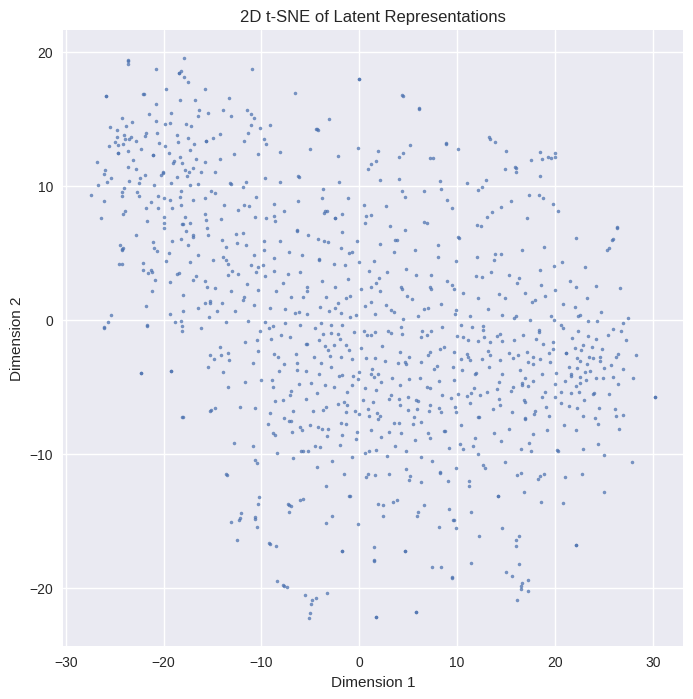

In [22]:
# Visualizing the Latent Space
# Latent space visualizations are a powerful tool to understand how the VAE encodes data.
# In this task, students are required to implement a visualization routine to observe the distribution of their data within the latent space.
# The goal is to project high-dimensional encoded data into two dimensions using t-SNE and inspect how different data points are clustered.

import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import torch

# Function to visualize the latent space
def visualize_latent_space(encoder, data_loader, num_samples=1000):
    """
    Uses a 2-dimensional t-SNE plot to visualize latent space of encoded images.

    # TODO: Implement a loop to encode a batch of images and collect their latent representations.
    # TODO: Use t-SNE to reduce dimensions of these latent representations for visualization.

    Parameters:
    encoder (torch.nn.Module): The encoder model component of the VAE.
    data_loader (torch.utils.data.DataLoader)
    num_samples (int): Number of samples to visualize
    """
    # - Set model to evaluation mode
    encoder.eval()
    device = next(encoder.parameters()).device

    # Collect samples until we reach num_samples

    # - Limit the number of samples based on the user's preference

    # - Move images to the same device as model

    # TODO: Use the encoder to get the mean (mu) of the latent distribution
    latents = []
    count = 0
    with torch.no_grad():
        for batch in data_loader:
            images, _, labels = batch
            images = images.to(device)

            mu, logvar = encoder(images)[:-1]
            latents.append(mu.cpu())

            count += images.size(0)
            if count >= num_samples:
                break

    # - Stack all obtained latent vectors
    latents = torch.cat(latents, dim=0)
    latents = latents[:num_samples]
    latents = latents.numpy()

    # - t-SNE reduction to 2D for visualization
    tsne = TSNE(n_components=2, verbose=1, random_state=42)
    latents_2d = tsne.fit_transform(latents)

    # - Plotting the 2D projection
    plt.figure(figsize=(8,8))
    plt.scatter(latents_2d[:,0], latents_2d[:,1], s=5, alpha=0.7)
    plt.title("2D t-SNE of Latent Representations")
    plt.xlabel("Dimension 1")
    plt.ylabel("Dimension 2")
    plt.grid(True)
    plt.show()

# TODO: Use visualize_latent_space function post-training to observe the latent space
visualize_latent_space(model.encoder, train_loader)

## 1. Clustering and Class Representation

- **Can you identify clusters in the latent space that correspond to specific image features or categories?**  
   Clusters in the latent space often correspond to distinct features or categories of grayscale images. For instance, images with high texture may form distinct clusters compared to smooth, uniform ones. The VAE learns these structural and contextual features, allowing such clusters to emerge naturally based on shared attributes.

- **How do these clusters inform us about the VAE's ability to differentiate between various input characteristics related to color information?**  
   Well-defined clusters suggest that the VAE can effectively distinguish between grayscale features. This differentiation is crucial for colorization, as each cluster can encode specific priors that guide plausible color mappings (e.g., associating grassy textures with green hues). Poorly defined clusters indicate challenges in generalizing relationships between grayscale features and corresponding color information, leading to inconsistent outputs.

---

## 2. Continuity and Transitions

- **Analyze whether neighboring points in the latent space result in similar or different color outputs. What does this continuity suggest about the latent representation's smoothness?**  
   Neighboring points in a smooth latent space typically yield similar outputs, demonstrating the VAE's ability to learn a continuous representation. Significant differences between adjacent points may highlight training issues, such as insufficient regularization or noisy data. Smooth transitions confirm that the VAE captures gradual changes, ensuring realistic interpolation between inputs.

- **How could these visual transitions impact the quality and realism of the generated colorations, especially for input images that exhibit gradual changes (e.g., transitions in lighting or shading)?**  
   Smooth transitions in the latent space improve the realism of colorized outputs for grayscale inputs with gradual variations, such as lighting or shading changes. By mapping subtle grayscale intensity shifts to equally gradual color transitions, the VAE preserves the natural appearance of scenes. Abrupt changes in latent representation could produce unrealistic artifacts or inconsistent colorization.

---

## 3. Effectiveness of Dimensionality Reduction

- **Assess the effectiveness of t-SNE in projecting high-dimensional latent vectors into a comprehensible 2D representation. What limitations might exist, and how do they affect your interpretation?**  
   t-SNE is effective at visualizing clusters and local structures within high-dimensional latent spaces in 2D. However, it has notable limitations:
   - t-SNE prioritizes preserving local distances, potentially distorting global relationships (e.g., the relative distances between far-apart clusters may not reflect true spatial relationships in the original space).
   - The stochastic nature of t-SNE can produce inconsistent results across runs or with different hyperparameter configurations, complicating comparisons.
   - t-SNE does not inherently preserve the continuity of latent space, meaning transitions or gradients might not be accurately represented.

   These limitations make t-SNE a useful but imperfect tool for interpreting latent space. To gain deeper insights, complementary methods like UMAP or PCA may provide a more comprehensive understanding of latent structures.

Elaborate on how the encoder-decoder architecture facilitates the learning of complex data distributions in image colorization. How does this architecture differ from a simple autoencoder?
#### 1. Learning Complex Data Distributions
- **Encoder Role**: The encoder maps input grayscale images into a lower-dimensional latent space, capturing essential features and structural patterns while discarding irrelevant details. This mapping facilitates a probabilistic understanding of the data's underlying distribution, which is essential for tasks like colorization.
- **Latent Space Representation**: In the VAE, the latent space is designed to represent a continuous probability distribution, allowing the model to generalize well across similar inputs. This smooth latent representation ensures that even novel grayscale images can be mapped to plausible colorizations.
- **Decoder Role**: The decoder reconstructs the image by sampling from the latent distribution. For colorization, the decoder interprets grayscale features from the latent space and learns plausible mappings to RGB color outputs, effectively translating structural information into realistic color patterns.

#### 2. Advantages Over a Simple Autoencoder
- **Latent Space Regularization**: Unlike simple autoencoders, VAEs include a regularization term (via the Kullback-Leibler divergence) in their loss function. This enforces the latent space to approximate a known prior distribution (e.g., Gaussian), enabling better generalization and interpolation between data points.
- **Generative Capability**: A VAE can generate new, realistic colorizations by sampling from the latent distribution, even for unseen inputs. Simple autoencoders lack this probabilistic framework and are more prone to overfitting the training data.
- **Robustness to Input Variability**: The encoder-decoder structure in VAEs ensures that the model focuses on essential features in the input. This robustness is particularly important in colorization, where input images may vary in texture, lighting, or shading.
- **Capturing Multimodal Distributions**: The probabilistic latent representation allows the VAE to handle the inherent ambiguity in colorization tasks (e.g., a gray object could be blue or red). The decoder can sample from different regions of the latent space to produce diverse, yet plausible, outputs.

#### 3. Implications for Image Colorization
The encoder-decoder architecture enables the model to:
- Capture global structure and local details simultaneously, ensuring coherent color mapping.
- Learn a smooth, continuous latent representation that supports interpolations between grayscale inputs.
- Generalize well across diverse input images, producing realistic and contextually accurate colors.


Analyze the role of perceptual loss in enhancing the quality of colorized images. How does perceptual loss measure image similarity compared to pixel-wise losses like Mean Squared Error (MSE)?

#### 1. Limitations of Pixel-Wise Losses
- **Mean Squared Error (MSE)**:  
   Pixel-wise losses like MSE measure image similarity by directly comparing pixel intensities between the predicted and ground truth images. While effective for low-level accuracy, MSE has significant limitations:
   - **Lack of Contextual Awareness**: MSE focuses on pixel-by-pixel differences, ignoring high-level contextual or perceptual features.
   - **Blurred Outputs**: In tasks like image colorization, MSE often results in overly smooth and blurred outputs, as it averages plausible variations in color to minimize the loss.
   - **Inability to Capture Perceptual Quality**: MSE does not align well with human perception of image quality, which prioritizes structural and semantic coherence over exact pixel matching.

#### 2. How Perceptual Loss Measures Image Similarity
Perceptual loss computes image similarity based on high-level feature representations extracted from a pre-trained deep neural network (e.g., VGG-19). These features are often more aligned with human visual perception. Here's how it works:
- **Feature Space Comparison**: Instead of comparing pixel intensities, perceptual loss evaluates the similarity between corresponding layers of feature maps in the pre-trained network. These features capture texture, structure, and global patterns.
- **Focus on High-Level Semantics**: By comparing deeper layers of the network, perceptual loss prioritizes semantic content and perceptual fidelity over pixel-level accuracy. For instance, the texture of a grassy field or the structure of a human face may be better preserved.
- **Sensitivity to Visual Artifacts**: Perceptual loss penalizes visually jarring inconsistencies more effectively than MSE, ensuring smoother, more realistic outputs.

#### 3. Benefits of Perceptual Loss in Image Colorization
- **Realistic and Coherent Colors**: Perceptual loss guides the model to focus on high-level features, ensuring that colorization appears natural and contextually appropriate.
- **Sharpness and Texture**: It preserves finer details, such as edges and textures, resulting in sharper and more visually appealing images.
- **Handling Ambiguity**: Perceptual loss accommodates the multimodal nature of colorization by aligning with plausible color distributions rather than enforcing a single "correct" color at every pixel.

#### 4. Comparison Between MSE and Perceptual Loss
| **Criterion**        | **Pixel-Wise Loss (MSE)**          | **Perceptual Loss**             |
|-----------------------|------------------------------------|----------------------------------|
| **Focus**            | Pixel-level accuracy              | High-level semantic features    |
| **Visual Output**    | Blurry, overly smooth             | Sharp, realistic, and detailed  |
| **Alignment with Human Perception** | Weak                          | Strong                          |
| **Handling Ambiguity** | Poor (averages variations)        | Effective (captures plausible alternatives) |
| **Use Case**         | Low-level tasks (e.g., denoising) | High-level tasks (e.g., colorization) |


Discuss how the latent space in a VAE impacts the fidelity and diversity of generated color images. What effects could varying the dimensionality of the latent space have?

#### 1. Role of Latent Space in a VAE
- **Capturing Key Features**: The latent space in a VAE encodes the essential features of the input grayscale images in a compressed representation. This space is designed to capture the probability distribution of the data, which directly impacts the quality and diversity of generated color images.
- **Balancing Fidelity and Diversity**:
  - **Fidelity**: A well-trained latent space ensures that decoded outputs are faithful reconstructions of the input data. For colorization, this means producing plausible and contextually accurate colors.
  - **Diversity**: The probabilistic nature of the latent space allows the VAE to generate diverse outputs by sampling different points within the latent distribution. This capability is crucial for colorization tasks with inherent ambiguities (e.g., a gray car could be red, blue, or green).

#### 2. Effects of Latent Space Dimensionality
- **Low Dimensionality**:
  - **Pros**: A lower-dimensional latent space forces the model to focus on capturing only the most essential features of the input, reducing overfitting and ensuring that outputs are more consistent and generalizable.
  - **Cons**: Insufficient dimensionality may result in loss of important details, reducing the fidelity of the reconstructed images. For colorization, this might manifest as overly generic or unrealistic color mappings.

- **High Dimensionality**:
  - **Pros**: A higher-dimensional latent space allows the model to capture finer details and subtle variations in the input data, potentially improving fidelity.
  - **Cons**: High dimensionality can make the latent space more complex and harder to regularize, leading to overfitting or artifacts in the generated images. It may also reduce diversity, as the model might rely on memorizing training data instead of generalizing colorization rules.

#### 3. Optimizing Latent Space Dimensionality
- **Trade-off Between Fidelity and Diversity**:
  - A latent space that is too small may prioritize fidelity at the cost of diversity, producing colorizations that are plausible but lack variation.
  - A larger latent space may enhance diversity but risk lower fidelity due to the model capturing noise or irrelevant details.
- **Empirical Tuning**: The dimensionality of the latent space is typically determined through experimentation, balancing the trade-offs based on the specific dataset and task requirements.

#### 4. Additional Factors Influencing Latent Space Performance
- **Regularization**:
  - The VAE uses the KL divergence term in its loss function to enforce a structured, smooth latent space. This helps ensure continuity and supports interpolation, enabling diverse but plausible outputs.
- **Sampling Variability**:
  - Sampling points closer to the mean of the latent distribution often results in higher fidelity outputs, while sampling farther away may lead to more diverse or creative results but risks implausible colorizations.
- **Dataset Diversity**:
  - The quality of the latent space depends on the training data. A diverse dataset leads to a more representative latent space, enabling the VAE to generalize well and produce a broad range of realistic colorizations.

#### 5. Implications for Image Colorization
- **Fidelity**: A well-structured latent space ensures that the generated colors are consistent with the grayscale features, producing outputs that align with the context of the input.
- **Diversity**: The probabilistic nature of the latent space allows the VAE to explore various plausible colorizations for ambiguous grayscale inputs, enhancing the creative utility of the model.
- **Dimensionality Tuning**: Finding the optimal latent space dimensionality is critical for balancing these outcomes. It requires aligning the model's capacity with the complexity of the data.


# Image Segmentation with U-Net
Image segmentation is a crucial task in computer vision aimed at dividing an image into meaningful segments or objects. The U-Net architecture, famed for its utility in medical imaging, excels at this by leveraging its encoder-decoder structure, which efficiently learns and reconstructs image details. In this task, the U-Net is trained on pairs of images and masks, enabling it to delineate object boundaries at the pixel level with high precision. The training process involves preprocessing the data, adjusting network parameters, and evaluating the model using metrics like Intersection over Union (IoU) to ensure effective segmentation. Successful implementation of U-Net for this purpose can revolutionize applications in areas like autonomous vehicles, medical diagnosis, and agricultural monitoring.

Dataset: https://drive.google.com/drive/folders/1g97fGNQ6buixT8Hp96QyEYOMNKby5Oe8?usp=sharing

## Importing necessary libraries

In [ ]:
# import system libs
import os
import time
import glob
import shutil

# import data handling tools
import cv2
import PIL
import numpy as np
import pandas as pd
import seaborn as sns
from PIL import Image
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
# import necessary PyTorch libraries
...
print ('modules loaded')

modules loaded


## Load the Dataset

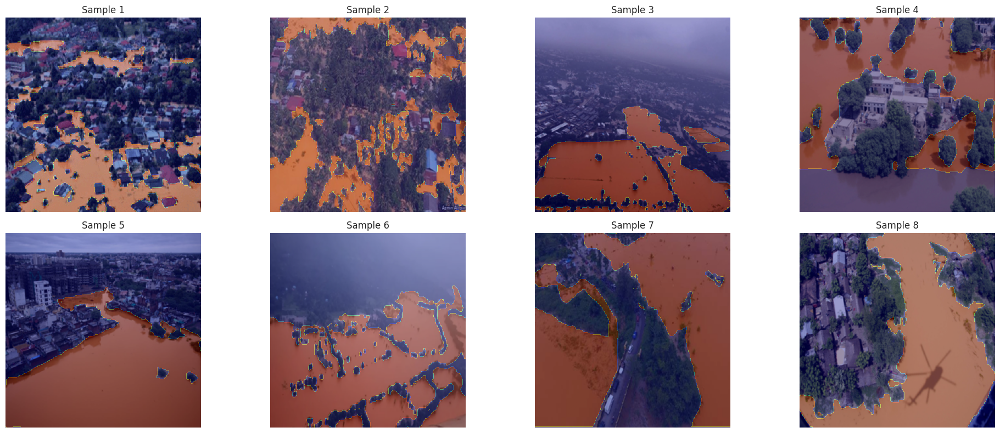

In [ ]:
def create_data(image_dir, mask_dir):
    """
    Traverse through the given data directory to extract and return paths to images and masks.
    - Identify relevant folders for images and masks.
    - Collect file paths from these folders and return them as lists.
    """
    image_files = [os.path.join(image_dir, f) for f in sorted(os.listdir(image_dir)) if f.endswith(('.jpg', '.png'))]
    mask_files = [os.path.join(mask_dir, f) for f in sorted(os.listdir(mask_dir)) if f.endswith(('.jpg', '.png'))]
    return image_files, mask_files

SIZE = 256

def load_image(image_path, SIZE):
    """
    Load and resize an individual image to the specified size, scaling pixel values appropriately.
    """
    image = Image.open(image_path)
    image = image.resize((SIZE, SIZE))
    if image.mode != 'RGB':
        image = image.convert('RGB')
    image = np.asarray(image, dtype=np.float32) / 255.0
    return image

def load_images(image_paths, SIZE, mask=False):
    """
    Batch process a list of image paths.
    """
    data = []
    for path in image_paths:
        img = load_image(path, SIZE)
        if mask:
            if img.ndim == 3:
                img = img[..., 0]  # Extract a single channel
            img = np.round(img).astype(np.uint8)
        data.append(img)
    return np.stack(data)

def show_image(image, title=None, cmap=None, alpha=1):
    """
    Display a single image using matplotlib with options for color map and transparency.
    - Ensure axes are turned off for a cleaner display.
    - Include optional title for context.
    """
    plt.figure(figsize=(5, 5))
    plt.imshow(image, cmap=cmap, alpha=alpha)
    if title:
        plt.title(title, fontsize=12)
    plt.axis('off')
    plt.show()

def show_mask(image, mask, cmap=None, alpha=0.4):
    """
    Overlay a mask on an image to visualize segmentation results.
    - Use transparency to allow both mask and image to be visible.
    - Include color mapping to differentiate mask areas.
    """
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.imshow(image, alpha=1.0)
    ax.imshow(mask, cmap=cmap, alpha=alpha)
    ax.axis('off')
    plt.show()

def show_images(images, masks, alpha=0.4, cmap='jet', num_samples=10):
    """
    Display multiple images with their corresponding masks overlaid.

    Args:
        images (np.array): Array of images (H, W, C).
        masks (np.array): Array of masks (H, W) or (H, W, 1).
        alpha (float): Transparency for mask overlay.
        cmap (str): Colormap for the mask overlay.
        num_samples (int): Number of image-mask pairs to visualize.
    """
    num_samples = min(num_samples, len(images), len(masks))
    fig, axes = plt.subplots(2, num_samples // 2, figsize=(20, 8))
    axes = axes.flatten()
    for i in range(num_samples):
        axes[i].imshow(images[i])
        axes[i].imshow(masks[i], cmap=cmap, alpha=alpha)
        axes[i].axis('off')
        axes[i].set_title(f"Sample {i+1}")
    plt.tight_layout()
    plt.show()

image_path = '/kaggle/input/dataset2/seg_archive/Image'
mask_path = '/kaggle/input/dataset2/seg_archive/Mask'

image_paths, mask_paths = create_data(image_path, mask_path)
images = load_images(image_paths, SIZE)
masks = load_images(mask_paths, SIZE, mask=True)
show_images(images[:8], masks[:8])

## The Architecture
In addition to U-Net, we are going to utilize Attention Gates.
You probably need to read this paper: https://arxiv.org/pdf/1804.03999v3

In [ ]:
# Model Components
class conv_block(nn.Module):
    def __init__(self, in_ch=3, n_filters=32, dropout_prob=0, max_pooling=True):
        """
        Constructs a convolutional block with optional max pooling.

        Args:
            in_ch (int): Number of input channels.
            n_filters (int): Number of convolutional filters.
            dropout_prob (float): Dropout probability.
            max_pooling (bool): Whether to include max pooling.
        """
        super(conv_block, self).__init__()
        self.max_pooling = max_pooling
        self.conv_sequence = nn.Sequential(
            nn.Conv2d(in_ch, n_filters, kernel_size=3, padding=1),
            nn.BatchNorm2d(n_filters),
            nn.ReLU(inplace=True),
            nn.Conv2d(n_filters, n_filters, kernel_size=3, padding=1),
            nn.BatchNorm2d(n_filters),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout_prob)
        )
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2) if max_pooling else nn.Identity()

    def forward(self, x):
        conv_out = self.conv_sequence(x)
        pooled = self.pool(conv_out)
        return pooled, conv_out

class upsampling_block(nn.Module):
    def __init__(self, in_ch, skip_ch, n_filters=32):
        """
        Constructs an upsampling block with transpose convolution and concatenation.

        Args:
            in_ch (int): Number of input channels from the previous layer.
            skip_ch (int): Number of channels from the skip connection.
            n_filters (int): Number of filters after upsampling.
        """
        super(upsampling_block, self).__init__()
        self.up_transpose = nn.ConvTranspose2d(in_ch, n_filters, kernel_size=2, stride=2)
        self.conv_sequence = nn.Sequential(
            nn.Conv2d(n_filters + skip_ch, n_filters, kernel_size=3, padding=1),
            nn.BatchNorm2d(n_filters),
            nn.ReLU(inplace=True),
            nn.Conv2d(n_filters, n_filters, kernel_size=3, padding=1),
            nn.BatchNorm2d(n_filters),
            nn.ReLU(inplace=True)
        )

    def forward(self, expansive_input, contractive_input):
        upsampled = self.up_transpose(expansive_input)
        # Handle potential size mismatches
        diffY = contractive_input.size(2) - upsampled.size(2)
        diffX = contractive_input.size(3) - upsampled.size(3)
        upsampled = F.pad(upsampled, [diffX // 2, diffX - diffX // 2,
                                      diffY // 2, diffY - diffY // 2])
        concatenated = torch.cat([contractive_input, upsampled], dim=1)
        return self.conv_sequence(concatenated)

class CompleteAttentionBlock(nn.Module):
    def __init__(self, F_l, F_int, F_g):
        """
        Constructs a complete attention block.

        Args:
            F_l (int): Number of channels in the skip connection.
            F_int (int): Number of intermediate channels.
            F_g (int): Number of channels from gating signal.
        """
        super(CompleteAttentionBlock, self).__init__()
        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(F_int)
        )
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, kernel_size=1),
            nn.BatchNorm2d(F_int)
        )
        self.relu = nn.ReLU(inplace=True)
        self.psi = nn.Sequential(
            nn.Conv2d(F_int, F_int, kernel_size=1),
            nn.BatchNorm2d(F_int)
        )
        self.sigmoid = nn.Sigmoid()
        self.upsample = nn.ConvTranspose2d(F_int, F_l, kernel_size=2, stride=2)

    def forward(self, x, g):
        x_proj = self.W_x(x)
        g_proj = self.W_g(g)
        combined = self.relu(x_proj + g_proj)
        psi = self.psi(combined)
        attention = self.sigmoid(psi)
        attention_up = self.upsample(attention)
        return x * attention_up

class UNet_With_Attention(nn.Module):
    def __init__(self, in_ch=3, n_filters=32, n_classes=1):
        """
        Initializes the U-Net model with attention mechanisms.

        Args:
            in_ch (int): Number of input channels.
            n_filters (int): Base number of filters.
            n_classes (int): Number of output classes.
        """
        super(UNet_With_Attention, self).__init__()

        self.enc1 = conv_block(in_ch, n_filters, dropout_prob=0.1, max_pooling=True)
        self.enc2 = conv_block(n_filters, n_filters*2, dropout_prob=0.1, max_pooling=True)
        self.enc3 = conv_block(n_filters*2, n_filters*4, dropout_prob=0.1, max_pooling=True)
        self.enc4 = conv_block(n_filters*4, n_filters*8, dropout_prob=0.1, max_pooling=True)
        self.enc5 = conv_block(n_filters*8, n_filters*16, dropout_prob=0.1, max_pooling=False)

        self.att4 = CompleteAttentionBlock(F_l=n_filters*8, F_int=n_filters*8, F_g=n_filters*16)
        self.att3 = CompleteAttentionBlock(F_l=n_filters*4, F_int=n_filters*4, F_g=n_filters*8)
        self.att2 = CompleteAttentionBlock(F_l=n_filters*2, F_int=n_filters*2, F_g=n_filters*4)
        self.att1 = CompleteAttentionBlock(F_l=n_filters, F_int=n_filters, F_g=n_filters*2)

        self.dec4 = upsampling_block(n_filters*16, n_filters*8, n_filters*8)
        self.dec3 = upsampling_block(n_filters*8, n_filters*4, n_filters*4)
        self.dec2 = upsampling_block(n_filters*4, n_filters*2, n_filters*2)
        self.dec1 = upsampling_block(n_filters*2, n_filters, n_filters)

        self.output_conv = nn.Sequential(
            nn.Conv2d(n_filters, n_classes, kernel_size=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        e1_pooled, e1 = self.enc1(x)
        e2_pooled, e2 = self.enc2(e1_pooled)
        e3_pooled, e3 = self.enc3(e2_pooled)
        e4_pooled, e4 = self.enc4(e3_pooled)
        e5_pooled, e5 = self.enc5(e4_pooled)

        a4 = self.att4(e4, e5_pooled)
        d4 = self.dec4(e5_pooled, a4)

        a3 = self.att3(e3, d4)
        d3 = self.dec3(d4, a3)

        a2 = self.att2(e2, d3)
        d2 = self.dec2(d3, a2)

        a1 = self.att1(e1, d2)
        d1 = self.dec1(d2, a1)

        out = self.output_conv(d1)
        return out


class DiceLoss(nn.Module):
    def __init__(self, epsilon=1e-6):
        """
        Initializes the Dice Loss.

        Args:
            epsilon (float): Small constant to prevent division by zero.
        """
        super(DiceLoss, self).__init__()
        self.epsilon = epsilon

    def forward(self, predictions, targets):
        """
        Computes the Dice loss between predictions and targets.

        Args:
            predictions (torch.Tensor): Predicted probabilities.
            targets (torch.Tensor): Ground truth masks.

        Returns:
            torch.Tensor: Dice loss value.
        """
        preds = predictions.contiguous()
        trgs = targets.contiguous()

        intersection = (preds * trgs).sum(dim=(2, 3))
        total = preds.sum(dim=(2, 3)) + trgs.sum(dim=(2, 3))

        dice = (2.0 * intersection + self.epsilon) / (total + self.epsilon)
        return 1.0 - dice.mean()

class JaccardLoss(nn.Module):
    def __init__(self, epsilon=1e-6):
        """
        Initializes the Jaccard (IoU) Loss.

        Args:
            epsilon (float): Small constant to prevent division by zero.
        """
        super(JaccardLoss, self).__init__()
        self.epsilon = epsilon

    def forward(self, predictions, targets):
        """
        Computes the Jaccard loss between predictions and targets.

        Args:
            predictions (torch.Tensor): Predicted probabilities.
            targets (torch.Tensor): Ground truth masks.

        Returns:
            torch.Tensor: Jaccard loss value.
        """
        preds = predictions.contiguous()
        trgs = targets.contiguous()

        intersection = (preds * trgs).sum(dim=(2, 3))
        union = preds.sum(dim=(2, 3)) + trgs.sum(dim=(2, 3)) - intersection

        jaccard = (intersection + self.epsilon) / (union + self.epsilon)
        return 1.0 - jaccard.mean()

class CombinedLoss(nn.Module):
    def __init__(self, epsilon=1e-6):
        """
        Combines Dice and Jaccard losses.

        Args:
            epsilon (float): Small constant to prevent division by zero.
        """
        super(CombinedLoss, self).__init__()
        self.dice = DiceLoss(epsilon)
        self.jaccard = JaccardLoss(epsilon)

    def forward(self, preds, trgs):
        """
        Computes the combined loss.

        Args:
            preds (torch.Tensor): Predicted probabilities.
            trgs (torch.Tensor): Ground truth masks.

        Returns:
            torch.Tensor: Combined loss value.
        """
        return self.dice(preds, trgs) + self.jaccard(preds, trgs)

## Training

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNet_With_Attention(in_ch=3, n_filters=32, n_classes=1).to(device)

criterion = CombinedLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, verbose=True)


def compute_accuracy(preds, trgs, threshold=0.5):
    """
    Computes pixel-wise accuracy between predictions and targets.

    Args:
        preds (torch.Tensor): Predicted probabilities.
        trgs (torch.Tensor): Ground truth masks.
        threshold (float): Threshold to binarize predictions.

    Returns:
        float: Average accuracy.
    """
    preds = (preds > threshold).float()
    correct = (preds == trgs).float()
    acc = correct.sum(dim=(2, 3)) / (trgs.size(2) * trgs.size(3))
    return acc.mean().item()

# Initialize lists to store metrics
train_losses = []
train_accuracies = []
val_losses = []
val_accuracies = []
best_val_loss = float('inf')
best_epoch = -1

# Training Loop

NUM_EPOCHS = 50

for epoch in range(NUM_EPOCHS):
    model.train()
    running_train_loss = 0.0
    running_train_acc = 0.0
    for imgs, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS} - Training"):
        imgs = imgs.to(device)
        masks = masks.to(device)

        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        running_train_loss += loss.item()
        running_train_acc += compute_accuracy(outputs, masks)

    avg_train_loss = running_train_loss / len(train_loader)
    avg_train_acc = running_train_acc / len(train_loader)

    train_losses.append(avg_train_loss)
    train_accuracies.append(avg_train_acc)

    model.eval()
    running_val_loss = 0.0
    running_val_acc = 0.0
    with torch.no_grad():
        for imgs, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS} - Validation"):
            imgs = imgs.to(device)
            masks = masks.to(device)

            outputs = model(imgs)
            loss = criterion(outputs, masks)
            running_val_loss += loss.item()

            acc = compute_accuracy(outputs, masks)
            running_val_acc += acc

    avg_val_loss = running_val_loss / len(train_loader)
    avg_val_acc = running_val_acc / len(train_loader)

    val_losses.append(avg_val_loss)
    val_accuracies.append(avg_val_acc)

    print(f"Epoch [{epoch+1}/{NUM_EPOCHS}] - "
          f"Train Loss: {avg_train_loss:.4f} - "
          f"Train Accuracy: {avg_train_acc:.4f} - "
          f"Val Loss: {avg_val_loss:.4f} - "
          f"Val Accuracy: {avg_val_acc:.4f}")

    scheduler.step(avg_val_loss)

    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        best_epoch = epoch + 1
        torch.save(model.state_dict(), 'best_unet_attention.pth')
        print("Saved Best Model!")

Epoch 1/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 1/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [1/50] - Train Loss: 1.1886 - Train Accuracy: 0.7525 - Val Loss: 1.2484 - Val Accuracy: 0.4108
Saved Best Model!


Epoch 2/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 2/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [2/50] - Train Loss: 1.0116 - Train Accuracy: 0.8294 - Val Loss: 1.0001 - Val Accuracy: 0.7638
Saved Best Model!


Epoch 3/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 3/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [3/50] - Train Loss: 0.9486 - Train Accuracy: 0.8465 - Val Loss: 0.8829 - Val Accuracy: 0.8570
Saved Best Model!


Epoch 4/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 4/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [4/50] - Train Loss: 0.9279 - Train Accuracy: 0.8389 - Val Loss: 0.9191 - Val Accuracy: 0.8521


Epoch 5/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 5/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [5/50] - Train Loss: 0.8948 - Train Accuracy: 0.8551 - Val Loss: 0.8321 - Val Accuracy: 0.8599
Saved Best Model!


Epoch 6/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 6/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [6/50] - Train Loss: 0.8626 - Train Accuracy: 0.8655 - Val Loss: 0.8658 - Val Accuracy: 0.8715


Epoch 7/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 7/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [7/50] - Train Loss: 0.8388 - Train Accuracy: 0.8687 - Val Loss: 0.8225 - Val Accuracy: 0.8823
Saved Best Model!


Epoch 8/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 8/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [8/50] - Train Loss: 0.8170 - Train Accuracy: 0.8728 - Val Loss: 0.7941 - Val Accuracy: 0.8859
Saved Best Model!


Epoch 9/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 9/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [9/50] - Train Loss: 0.8032 - Train Accuracy: 0.8735 - Val Loss: 0.7952 - Val Accuracy: 0.8774


Epoch 10/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 10/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [10/50] - Train Loss: 0.7745 - Train Accuracy: 0.8825 - Val Loss: 0.7676 - Val Accuracy: 0.8733
Saved Best Model!


Epoch 11/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 11/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [11/50] - Train Loss: 0.7625 - Train Accuracy: 0.8784 - Val Loss: 0.7435 - Val Accuracy: 0.8911
Saved Best Model!


Epoch 12/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 12/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [12/50] - Train Loss: 0.7407 - Train Accuracy: 0.8842 - Val Loss: 0.7451 - Val Accuracy: 0.8865


Epoch 13/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 13/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [13/50] - Train Loss: 0.7283 - Train Accuracy: 0.8816 - Val Loss: 0.7489 - Val Accuracy: 0.8996


Epoch 14/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 14/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [14/50] - Train Loss: 0.7018 - Train Accuracy: 0.8936 - Val Loss: 0.6631 - Val Accuracy: 0.8972
Saved Best Model!


Epoch 15/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 15/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [15/50] - Train Loss: 0.6800 - Train Accuracy: 0.8961 - Val Loss: 0.6692 - Val Accuracy: 0.8981


Epoch 16/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 16/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [16/50] - Train Loss: 0.6604 - Train Accuracy: 0.9017 - Val Loss: 0.6475 - Val Accuracy: 0.9065
Saved Best Model!


Epoch 17/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 17/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [17/50] - Train Loss: 0.6546 - Train Accuracy: 0.8949 - Val Loss: 0.7078 - Val Accuracy: 0.8712


Epoch 18/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 18/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [18/50] - Train Loss: 0.6511 - Train Accuracy: 0.8921 - Val Loss: 0.6447 - Val Accuracy: 0.9082
Saved Best Model!


Epoch 19/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 19/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [19/50] - Train Loss: 0.6131 - Train Accuracy: 0.9053 - Val Loss: 0.6132 - Val Accuracy: 0.9080
Saved Best Model!


Epoch 20/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 20/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [20/50] - Train Loss: 0.6129 - Train Accuracy: 0.9004 - Val Loss: 0.5785 - Val Accuracy: 0.9134
Saved Best Model!


Epoch 21/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 21/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [21/50] - Train Loss: 0.5928 - Train Accuracy: 0.9049 - Val Loss: 0.5862 - Val Accuracy: 0.9128


Epoch 22/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 22/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [22/50] - Train Loss: 0.5728 - Train Accuracy: 0.9083 - Val Loss: 0.6015 - Val Accuracy: 0.9034


Epoch 23/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 23/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [23/50] - Train Loss: 0.5849 - Train Accuracy: 0.9008 - Val Loss: 0.5755 - Val Accuracy: 0.9040
Saved Best Model!


Epoch 24/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 24/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [24/50] - Train Loss: 0.5524 - Train Accuracy: 0.9099 - Val Loss: 0.5452 - Val Accuracy: 0.9164
Saved Best Model!


Epoch 25/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 25/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [25/50] - Train Loss: 0.5366 - Train Accuracy: 0.9113 - Val Loss: 0.5238 - Val Accuracy: 0.9248
Saved Best Model!


Epoch 26/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 26/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [26/50] - Train Loss: 0.5203 - Train Accuracy: 0.9165 - Val Loss: 0.4872 - Val Accuracy: 0.9270
Saved Best Model!


Epoch 27/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 27/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [27/50] - Train Loss: 0.4963 - Train Accuracy: 0.9202 - Val Loss: 0.5045 - Val Accuracy: 0.9137


Epoch 28/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 28/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [28/50] - Train Loss: 0.5008 - Train Accuracy: 0.9153 - Val Loss: 0.4727 - Val Accuracy: 0.9214
Saved Best Model!


Epoch 29/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 29/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [29/50] - Train Loss: 0.4844 - Train Accuracy: 0.9203 - Val Loss: 0.4649 - Val Accuracy: 0.9262
Saved Best Model!


Epoch 30/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 30/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [30/50] - Train Loss: 0.4557 - Train Accuracy: 0.9264 - Val Loss: 0.4514 - Val Accuracy: 0.9346
Saved Best Model!


Epoch 31/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 31/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [31/50] - Train Loss: 0.4527 - Train Accuracy: 0.9258 - Val Loss: 0.4255 - Val Accuracy: 0.9353
Saved Best Model!


Epoch 32/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 32/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [32/50] - Train Loss: 0.4285 - Train Accuracy: 0.9312 - Val Loss: 0.4126 - Val Accuracy: 0.9348
Saved Best Model!


Epoch 33/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 33/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [33/50] - Train Loss: 0.4180 - Train Accuracy: 0.9308 - Val Loss: 0.4223 - Val Accuracy: 0.9352


Epoch 34/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 34/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [34/50] - Train Loss: 0.4217 - Train Accuracy: 0.9273 - Val Loss: 0.4311 - Val Accuracy: 0.9334


Epoch 35/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 35/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [35/50] - Train Loss: 0.4248 - Train Accuracy: 0.9245 - Val Loss: 0.4269 - Val Accuracy: 0.9269


Epoch 36/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 36/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [36/50] - Train Loss: 0.4060 - Train Accuracy: 0.9300 - Val Loss: 0.4132 - Val Accuracy: 0.9303


Epoch 37/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 37/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [37/50] - Train Loss: 0.3998 - Train Accuracy: 0.9310 - Val Loss: 0.3916 - Val Accuracy: 0.9283
Saved Best Model!


Epoch 38/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 38/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [38/50] - Train Loss: 0.3760 - Train Accuracy: 0.9362 - Val Loss: 0.3828 - Val Accuracy: 0.9400
Saved Best Model!


Epoch 39/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 39/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [39/50] - Train Loss: 0.3751 - Train Accuracy: 0.9359 - Val Loss: 0.3529 - Val Accuracy: 0.9381
Saved Best Model!


Epoch 40/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 40/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [40/50] - Train Loss: 0.3817 - Train Accuracy: 0.9318 - Val Loss: 0.3344 - Val Accuracy: 0.9361
Saved Best Model!


Epoch 41/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 41/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [41/50] - Train Loss: 0.3539 - Train Accuracy: 0.9382 - Val Loss: 0.3212 - Val Accuracy: 0.9457
Saved Best Model!


Epoch 42/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 42/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [42/50] - Train Loss: 0.3316 - Train Accuracy: 0.9441 - Val Loss: 0.3154 - Val Accuracy: 0.9455
Saved Best Model!


Epoch 43/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 43/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [43/50] - Train Loss: 0.3235 - Train Accuracy: 0.9465 - Val Loss: 0.3171 - Val Accuracy: 0.9497


Epoch 44/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 44/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [44/50] - Train Loss: 0.3109 - Train Accuracy: 0.9486 - Val Loss: 0.3019 - Val Accuracy: 0.9524
Saved Best Model!


Epoch 45/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 45/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [45/50] - Train Loss: 0.2996 - Train Accuracy: 0.9506 - Val Loss: 0.2714 - Val Accuracy: 0.9530
Saved Best Model!


Epoch 46/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 46/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [46/50] - Train Loss: 0.3007 - Train Accuracy: 0.9492 - Val Loss: 0.2853 - Val Accuracy: 0.9499


Epoch 47/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 47/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [47/50] - Train Loss: 0.2926 - Train Accuracy: 0.9500 - Val Loss: 0.2785 - Val Accuracy: 0.9515


Epoch 48/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 48/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [48/50] - Train Loss: 0.2862 - Train Accuracy: 0.9500 - Val Loss: 0.2687 - Val Accuracy: 0.9539
Saved Best Model!


Epoch 49/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 49/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [49/50] - Train Loss: 0.2833 - Train Accuracy: 0.9509 - Val Loss: 0.2507 - Val Accuracy: 0.9552
Saved Best Model!


Epoch 50/50 - Training:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch 50/50 - Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Epoch [50/50] - Train Loss: 0.2781 - Train Accuracy: 0.9507 - Val Loss: 0.2634 - Val Accuracy: 0.9538


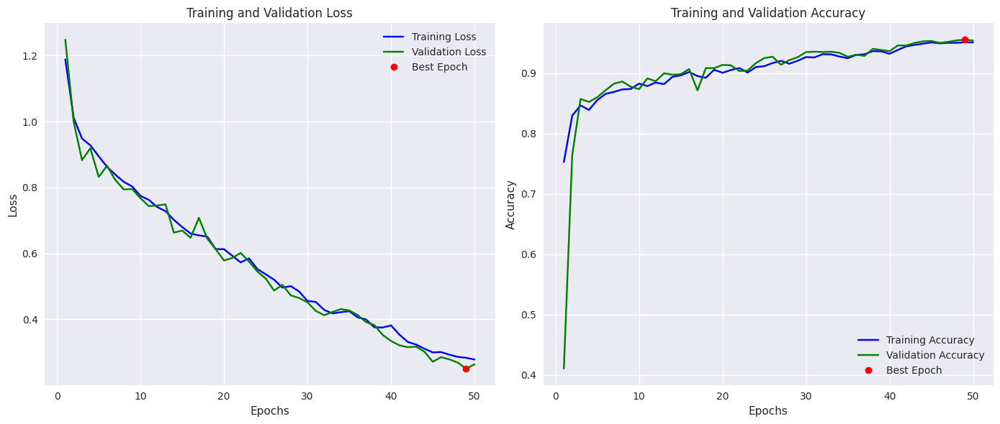

Best Validation Loss achieved at Epoch 49


In [ ]:
# TODO: Plot training and validation losses and accuracies
# TODO: Plot training and validation losses and accuracies
epochs = range(1, NUM_EPOCHS + 1)

plt.figure(figsize=(14, 6))

# Plot Losses
plt.subplot(1, 2, 1)
plt.plot(epochs, train_losses, 'b-', label='Training Loss')
plt.plot(epochs, val_losses, 'g-', label='Validation Loss')
plt.plot(best_epoch, val_losses[best_epoch - 1], 'ro', label='Best Epoch')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot Accuracies
plt.subplot(1, 2, 2)
plt.plot(epochs, train_accuracies, 'b-', label='Training Accuracy')
plt.plot(epochs, val_accuracies, 'g-', label='Validation Accuracy')
plt.plot(best_epoch, val_accuracies[best_epoch - 1], 'ro', label='Best Epoch')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

print(f"Best Validation Loss achieved at Epoch {best_epoch}")

## Plottings

/tmp/ipykernel_23/1459429588.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_unet_attention.pth'))


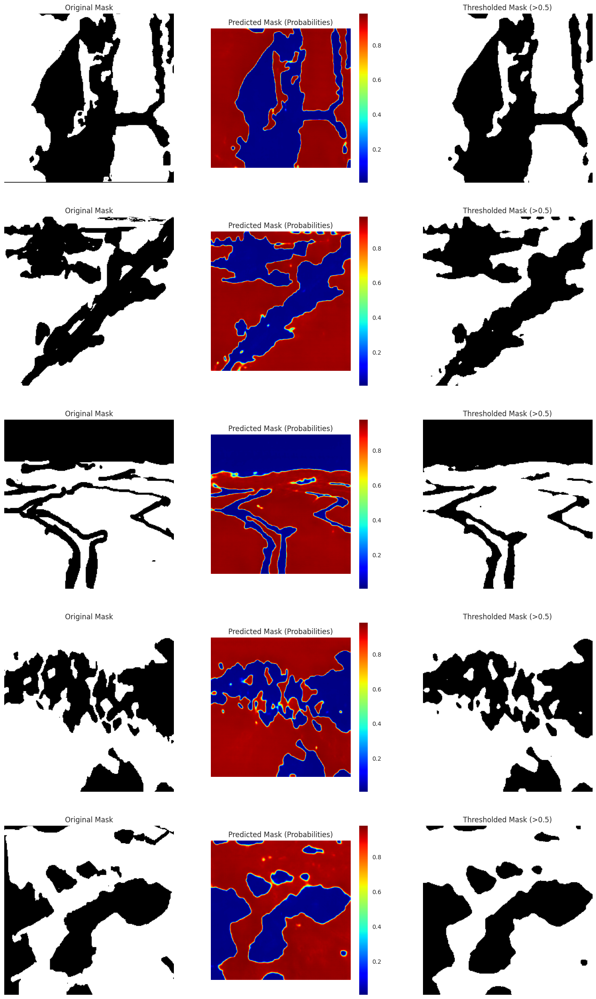

In [ ]:
# Load the Best Model
model.load_state_dict(torch.load('best_unet_attention.pth'))
model.eval()

def visualize_masks(model, dataloader, device, num_samples=5, threshold=0.5):
    """
    Visualizes the original mask, predicted mask (probabilities), and thresholded predicted mask.

    Args:
        model (nn.Module): Trained segmentation model.
        dataloader (DataLoader): DataLoader for the dataset.
        device (torch.device): Computation device.
        num_samples (int): Number of samples to visualize.
        threshold (float): Threshold to binarize predictions.
    """
    samples_visualized = 0
    plt.figure(figsize=(18, num_samples * 6))

    with torch.no_grad():
        for imgs, masks in dataloader:
            imgs = imgs.to(device)
            masks = masks.to(device)

            outputs = model(imgs)

            preds_prob = outputs.cpu().numpy()
            preds_binary = (outputs > threshold).float().cpu().numpy()
            masks = masks.cpu().numpy()
            imgs = imgs.cpu().numpy()

            for i in range(imgs.shape[0]):
                if samples_visualized >= num_samples:
                    plt.show()
                    return

                img = imgs[i].transpose(1, 2, 0)
                img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
                img = np.clip(img, 0, 1)

                original_mask = masks[i].squeeze()

                predicted_mask_prob = preds_prob[i].squeeze()

                predicted_mask_binary = preds_binary[i].squeeze()

                plt.subplot(num_samples, 3, samples_visualized * 3 + 1)
                plt.imshow(original_mask, cmap='gray')
                plt.title("Original Mask")
                plt.axis('off')

                plt.subplot(num_samples, 3, samples_visualized * 3 + 2)
                plt.imshow(predicted_mask_prob, cmap='jet')
                plt.title("Predicted Mask (Probabilities)")
                plt.colorbar()
                plt.axis('off')

                plt.subplot(num_samples, 3, samples_visualized * 3 + 3)
                plt.imshow(predicted_mask_binary, cmap='gray')
                plt.title(f"Thresholded Mask (>{threshold})")
                plt.axis('off')

                samples_visualized += 1

                if samples_visualized >= num_samples:
                    break
    plt.tight_layout()
    plt.show()

visualize_masks(model, train_loader, device, num_samples=5, threshold=0.5)

/tmp/ipykernel_23/1210480184.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_unet_attention.pth'))


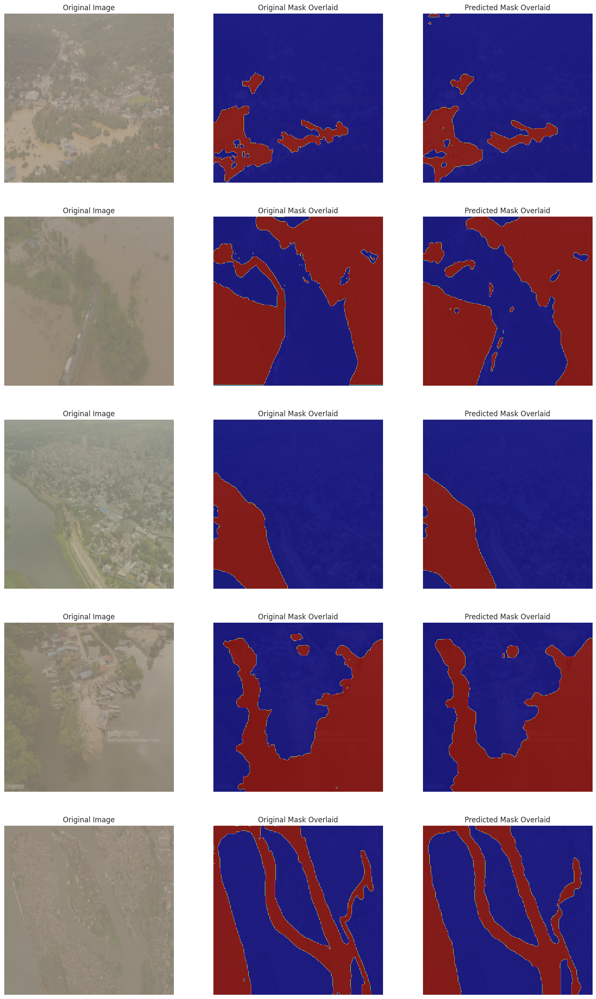

In [ ]:
# Plot the original mask, the one you predicted, and the final one using a threshold
# Load the Best Model
model.load_state_dict(torch.load('best_unet_attention.pth'))
model.eval()

def visualize_masks(model, dataloader, device, num_samples=5, threshold=0.5):
    """
    Visualizes the original mask, predicted mask (probabilities), and thresholded predicted mask overlaid on the image.

    Args:
        model (nn.Module): Trained segmentation model.
        dataloader (DataLoader): DataLoader for the dataset.
        device (torch.device): Computation device.
        num_samples (int): Number of samples to visualize.
        threshold (float): Threshold to binarize predictions.
    """
    samples_visualized = 0
    plt.figure(figsize=(18, num_samples * 6))

    with torch.no_grad():
        for imgs, masks in dataloader:
            imgs = imgs.to(device)
            masks = masks.to(device)

            outputs = model(imgs)

            preds_prob = outputs.cpu().numpy()
            preds_binary = (outputs > threshold).float().cpu().numpy()
            masks = masks.cpu().numpy()
            imgs = imgs.cpu().numpy()

            for i in range(imgs.shape[0]):
                if samples_visualized >= num_samples:
                    plt.show()
                    return

                img = imgs[i].transpose(1, 2, 0)
                img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
                img = np.clip(img, 0, 1)

                original_mask = masks[i].squeeze()

                predicted_mask_prob = preds_prob[i].squeeze()

                predicted_mask_binary = preds_binary[i].squeeze()

                plt.subplot(num_samples, 3, samples_visualized * 3 + 1)
                plt.imshow(img)
                plt.title("Original Image")
                plt.axis('off')

                plt.subplot(num_samples, 3, samples_visualized * 3 + 2)
                plt.imshow(img)
                plt.imshow(original_mask, cmap='jet', alpha=0.8)
                plt.title("Original Mask Overlaid")
                plt.axis('off')

                plt.subplot(num_samples, 3, samples_visualized * 3 + 3)
                plt.imshow(img)
                plt.imshow(predicted_mask_binary, cmap='jet', alpha=0.8)
                plt.title("Predicted Mask Overlaid")
                plt.axis('off')

                samples_visualized += 1

                if samples_visualized >= num_samples:
                    break
    plt.tight_layout()
    plt.show()

visualize_masks(model, train_loader, device, num_samples=5, threshold=0.5)

## 1. Comparison with Conventional Loss Functions

### How do Dice and Jaccard Losses differ from Cross-Entropy or Mean Squared Error, particularly in terms of sensitivity to class imbalances?
- **Dice and Jaccard Losses** are specifically designed for segmentation tasks where the spatial overlap between the predicted and true masks is critical. These losses directly measure the degree of overlap between predicted and ground truth masks.
- **Cross-Entropy Loss**, while commonly used for classification tasks, can struggle with class imbalances, especially in segmentation tasks where the background class often dominates. It evaluates each pixel independently and doesn't consider the spatial structure of the mask.
- **Mean Squared Error (MSE)**, primarily used for regression, is unsuitable for segmentation as it assumes continuous outputs and lacks sensitivity to spatial relationships or overlap.
- **Sensitivity to Class Imbalance**: Dice and Jaccard Losses are more robust to class imbalances because they normalize the loss by the total size of the masks (i.e., accounting for the union or sum of the masks). This ensures that smaller regions (like objects or lesions) contribute proportionally to the loss, unlike Cross-Entropy, where large background regions can dominate.

### What advantages do these losses offer in capturing the spatial overlap between the predicted and true segmentations?
- Dice and Jaccard Losses inherently reward spatial overlap, focusing on the alignment of predicted and true positive regions. They measure:
  - **Dice Loss**: The harmonic mean of precision and recall (sensitive to both false positives and false negatives).
  - **Jaccard Loss (IoU)**: The ratio of the intersection area to the union area between predicted and true masks.
- These metrics directly optimize for better region alignment, which is crucial for segmentation tasks where predicting the shape and boundaries of objects is important.
- By focusing on overlap, these losses effectively capture spatial dependencies and encourage better object-level predictions rather than pixel-level accuracy alone.

---

## 2. Interpretation of Loss Values

### Discuss what high or low loss scores reveal about the state and effectiveness of your segmentation model.
- **High Loss Scores:**
  - Indicate poor overlap between predicted and ground truth masks.
  - Could signal that the model struggles to identify key features, has insufficient capacity, or the data is too noisy or complex.
  - May arise due to issues such as class imbalance, inappropriate thresholding, or suboptimal architecture/hyperparameters.
  
- **Low Loss Scores:**
  - Reflect better overlap between predicted and true masks, meaning the model is capturing the spatial structure of the segmentation task effectively.
  - A consistently low loss during training and validation indicates good model generalization.
  
- **Important Notes:**
  - **Validation Loss Trends:** If the validation loss stagnates or increases while the training loss decreases, this could indicate overfitting.
  - **Plateaued Loss:** A very low loss might signal convergence, but if accuracy metrics like Dice/IoU are suboptimal, the model might still underperform in some regions (e.g., small or complex objects).
  - **Interpretation in Context:** Loss values must always be interpreted alongside accuracy metrics like Dice Score, IoU, and pixel-wise accuracy to ensure a holistic understanding of model performance.


Evaluate the role of the attention mechanism in optimizing segmentation accuracy in cluttered environments. How does it refine the segmentation process?

- **Role of the Attention Mechanism:**
  - The attention mechanism dynamically highlights relevant spatial regions while suppressing irrelevant or noisy areas, particularly in cluttered environments where segmentation becomes challenging.
  - It allows the network to **focus on critical features** (e.g., edges, objects of interest) by weighting features based on their importance for the current task.

- **Key Contributions to Segmentation Accuracy:**
  1. **Feature Relevance:**
     - By weighting feature maps, the attention mechanism ensures that regions with significant features (e.g., boundaries or small objects) contribute more prominently to the segmentation process.
  2. **Noise Suppression:**
     - It suppresses irrelevant features or background clutter, enabling the model to handle challenging environments with occlusions, overlapping objects, or noisy inputs.
  3. **Context Awareness:**
     - Attention layers incorporate global context, helping the model understand relationships between distant regions, which is critical for segmenting objects that are disjoint or have similar textures to the background.
  4. **Boundary Refinement:**
     - By focusing on salient regions, the attention mechanism enhances boundary delineation, making the segmentation output more precise and reducing ambiguities.

- **Impact in Cluttered Environments:**
  - In complex or cluttered environments, where background noise or overlapping objects may hinder segmentation accuracy, the attention mechanism effectively separates the foreground (object of interest) from the background.
  - For example, in medical imaging, attention gates can help segment lesions or tumors in scans where surrounding tissue may obscure the region of interest.

- **Quantitative Benefits:**
  - Models with attention mechanisms often achieve higher **Dice Scores** and **IoU** metrics, especially in datasets with challenging object-to-background ratios.
  - They reduce false positives and false negatives by directing the model's focus to regions where it is most needed.


What is the importance of skip connections in U-Net, and how do they enhance the accuracy of segmentation tasks?


- **Role of Skip Connections:**
  - Skip connections in U-Net directly connect the encoder (downsampling) layers to the corresponding decoder (upsampling) layers, bypassing intermediate layers.
  - They transfer **spatial and high-resolution feature information** lost during downsampling back to the decoder, helping the model reconstruct finer details in the output segmentation.

- **Key Contributions to Segmentation Accuracy:**
  1. **Preservation of Spatial Information:**
     - During downsampling, critical spatial details (like edges, textures, and object boundaries) may be lost due to pooling or stride operations. Skip connections reintroduce this high-resolution information to the decoder.
  2. **Improved Gradient Flow:**
     - By providing direct pathways between layers, skip connections facilitate smoother gradient flow during backpropagation, reducing the risk of vanishing gradients and improving training stability.
  3. **High-Frequency Detail Recovery:**
     - Skip connections ensure that low-level features (like edges and textures) from earlier layers are combined with high-level semantic features from deeper layers, enabling precise segmentation of small or complex objects.
  4. **Reduction of Information Bottlenecks:**
     - Without skip connections, the encoder-decoder architecture relies solely on the bottleneck layer to transfer information, which may lead to loss of important features. Skip connections alleviate this limitation by supplementing the decoder with additional context.

- **Impact on Segmentation Tasks:**
  - **Boundary Precision:**
    - Skip connections help delineate object boundaries more accurately by reintroducing spatial details from the encoder to the decoder.
  - **Small Object Segmentation:**
    - They enhance the segmentation of small or intricate structures (e.g., lesions, small objects) by retaining their high-frequency features, which might otherwise be lost in deeper layers.
  - **Faster Convergence:**
    - By providing direct access to early-layer features, skip connections accelerate model training and improve convergence rates.

- **Visual Example:**
  - For instance, in medical imaging tasks, skip connections allow precise segmentation of small tumors or lesions by integrating low-level spatial details with high-level contextual information.


Explain the difference between the predicted and processed mask above.


### Predicted Mask:
- The **predicted mask** represents the raw output from the model, where each pixel value corresponds to a probability (ranging between 0 and 1) of belonging to a certain class.
- This output is continuous and reflects the model's confidence in its predictions. It retains fine-grained information about the likelihood of each pixel being part of the object or background.
- **Characteristics:**
  - Continuous values, often requiring thresholding to convert into a binary segmentation mask.
  - Provides insight into areas where the model is uncertain, such as boundary regions or overlapping objects.
  - Useful for evaluating the model's confidence and understanding soft predictions.

### Processed Mask:
- The **processed mask** is the binary result obtained after applying a threshold to the predicted mask.
- Pixels with a probability above the threshold (e.g., 0.5) are classified as part of the object, while others are classified as background.
- This mask is typically used for visualization and evaluation, as it provides a discrete segmentation output that matches the format of the ground truth mask.
- **Characteristics:**
  - Binary values (0 or 1), representing the final segmentation result.
  - Easier to compare directly against ground truth for metrics like Dice Score, IoU, and pixel-wise accuracy.
  - Simplifies downstream tasks by converting probabilities into definitive decisions.

### Key Differences:
1. **Nature of Values:**
   - Predicted Mask: Continuous values (0 to 1).
   - Processed Mask: Binary values (0 or 1) after thresholding.
2. **Purpose:**
   - Predicted Mask: Reflects model confidence and can highlight regions of uncertainty.
   - Processed Mask: Final segmentation output, used for visualization and performance evaluation.
3. **Information Retention:**
   - Predicted Mask: Retains uncertainty information, which can be useful for fine-tuning or understanding model behavior.
   - Processed Mask: Removes uncertainty by converting probabilities into discrete classifications.
